## Import Necessary Modules

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import random 
import numpy as np
import joblib
import collections
import copy
from sklearn.model_selection import train_test_split
import seaborn as sns
import scipy
import time
import math
from statsmodels.stats.multitest import fdrcorrection as fdrcorrection
from numpy import mean
from numpy import var
from math import sqrt
from math import atan2
from math import degrees
from scipy.stats import spearmanr
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error




In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The pgf.debug rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.


## One-Hot Encoding

In [2]:
# Adapted from Hsu et al. (2022)
aa_to_int = {
    'M':1,
    'R':2,
    'H':3,
    'K':4,
    'D':5,
    'E':6,
    'S':7,
    'T':8,
    'N':9,
    'Q':10, 'C':11,
    'U':12,
    'G':13,
    'P':14,
    'A':15,
    'V':16,
    'I':17,
    'F':18,
    'Y':19,
    'W':20,
    'L':21,
    'O':22, #Pyrrolysine
    'X':23, # Unknown
    'Z':23, # Glutamic acid or GLutamine
    'B':23, # Asparagine or aspartic acid
    'J':23, # Leucine or isoleucine
    'start':24,
    'stop':25,
    '-':26,
}
def seqs_to_onehot(seqs):
    seqs = format_batch_seqs(seqs)
    X = np.zeros((seqs.shape[0], seqs.shape[1]*24), dtype=int)
    for i in range(seqs.shape[1]):
        for j in range(24):
            X[:, i*24+j] = (seqs[:, i] == j)
    return X
def format_batch_seqs(seqs):
    maxlen = 755
#     for s in seqs:
#         if len(s) > maxlen:
#             maxlen = len(s)
    formatted = []
    for seq in seqs:
        pad_len = maxlen - len(seq)
        padded = np.pad(format_seq(seq), (0, pad_len), 'constant', constant_values=0)
        formatted.append(padded)
    return np.stack(formatted)
def format_seq(seq,stop=False):
    """
    Takes an amino acid sequence, returns a list of integers in the codex of the babbler.
    Here, the default is to strip the stop symbol (stop=False) which would have 
    otherwise been added to the end of the sequence. If you are trying to generate
    a rep, do not include the stop. It is probably best to ignore the stop if you are
    co-tuning the babbler and a top model as well.
    """
    if stop:
        int_seq = aa_seq_to_int(seq.strip())
    else:
        int_seq = aa_seq_to_int(seq.strip())[:-1]
    return int_seq
def aa_seq_to_int(s):
    """
    Return the int sequence as a list for a given string of amino acids
    """
    return [24] + [aa_to_int[a] for a in s] + [25]


## Figure 1

### VP3 PCA Plot (Figure 1B)

In [3]:
# Here you can provide whatever embeddings you would generate from either a protein language model or some other amino acid representation.
#hvg = get_embeddings(a_list)
#np.savetxt('Input/hvgVP3.txt',hvg,fmt='%s')

In [4]:
X = np.loadtxt('Input/hvg.txt')
df = pd.read_csv('Input/ogden_viral_selection_AAV2_sequences_VP3.csv')
y = df['selection_wt_norm_AVG']
y.pop(2) #Remove the row that contains an empty sequence.
print(X.shape, y.shape)


(21778, 1900) (21778,)


In [5]:
train_size = 0.8
Xs_train, Xs_test, ys_train, ys_test = train_test_split(X, y, train_size=train_size, random_state=42)
print(Xs_train.shape, ys_test.shape)

(17422, 1900) (4356,)


In [6]:
pca = PCA(n_components=0.95, svd_solver='full')
Xs_train_pca = pca.fit_transform(X)
print(Xs_train_pca.shape)

(21778, 8)


In [7]:
## Assert that all sequences with a PCA1 and PCA2 greater than 1 have a stop codon mutation.
name_df=pd.read_csv('Input/ogden_viral_selection_AAV2_sequences_VP3.csv')['id']
name_df.pop(2) #Remove the row that contains an empty sequence.
ID=np.array(name_df)
indices_x=[i for i, x in enumerate(Xs_train_pca[:,0]) if x>1]
indices_y=[i for i, x in enumerate(Xs_train_pca[:,1]) if x>1]
indices=[x for x in indices_x if x in indices_y]
arm=np.take(ID,indices,axis=0)
np.array(arm)
PCA_train_add=np.add(Xs_train_pca[:,0],Xs_train_pca[:,1])
print(all(['*' in i for i in ID[np.argsort(PCA_train_add)[-265:]]]))


True


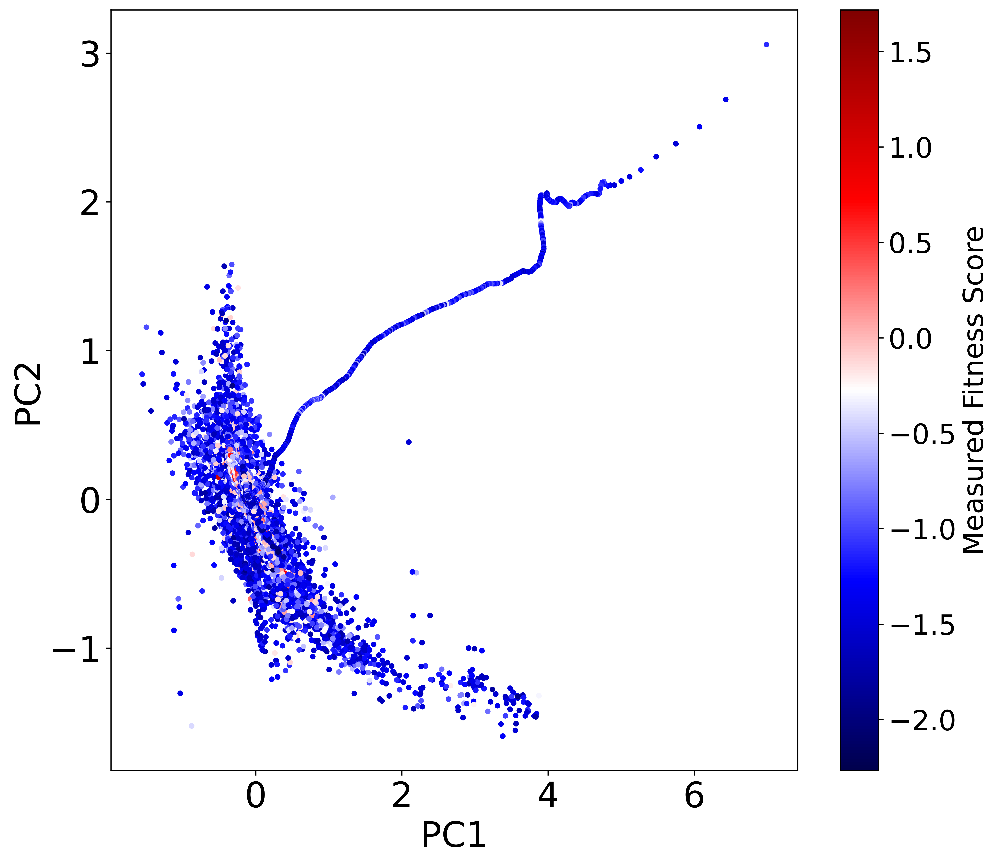

In [8]:
plt.rcParams.update({'font.size': 25})
fig_dims = (11, 10)
fig, ax = plt.subplots(figsize=fig_dims, dpi=600)
plt.rcParams.update({'font.size': 20})
sc = ax.scatter(Xs_train_pca[:,0], Xs_train_pca[:,1], c=y, marker=".",label='VP3 PLM Embeddings',cmap='seismic')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
plt.colorbar(sc, label='Measured Fitness Score')

(-0.6, 0.4)

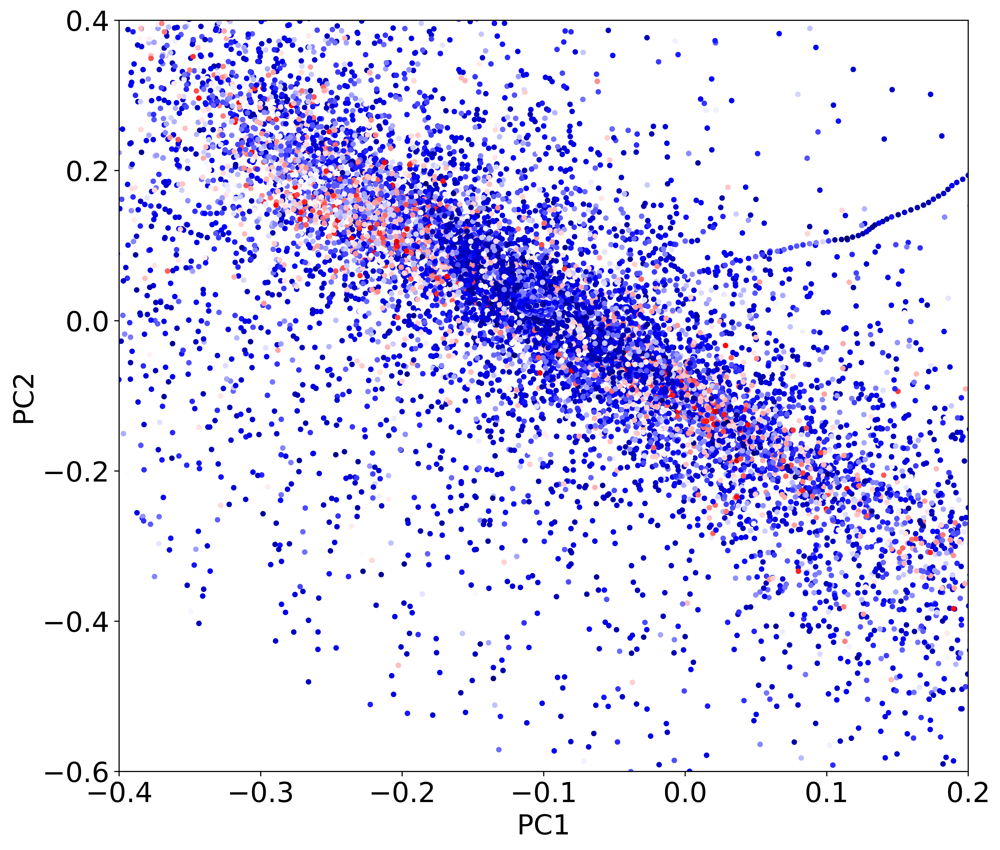

In [9]:
fig_dims = (11, 10)
fig, ax = plt.subplots(figsize=fig_dims, dpi=600)
sc = ax.scatter(Xs_train_pca[:,0], Xs_train_pca[:,1], c=y, marker=".",label='VP3 PLM Embeddings',cmap='seismic')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_xlim([-0.4,0.2])
ax.set_ylim([-0.6,0.4])

### Performance Scatter Plots (Figure 1C)

In [3]:
IX = np.loadtxt('Input/hvg.txt')
df = pd.read_csv('Input/ogden_viral_selection_AAV2_sequences_VP3.csv')
Iy = df['selection_wt_norm_AVG']
Iy.pop(2)
print(IX.shape, Iy.shape)
train_size = 0.8
IX_train,IX_test,Iy_train,Iy_test=train_test_split(IX, Iy, train_size=train_size, random_state=42)


(21778, 1900) (21778,)


SpearmanrResult(correlation=0.652497582064067, pvalue=0.0)
Pearson Correlation and P-Score: (0.6776025841657981, 0.0)
RMSE: 0.4460119145113019

 -------------------------------------------------------------------------------- 



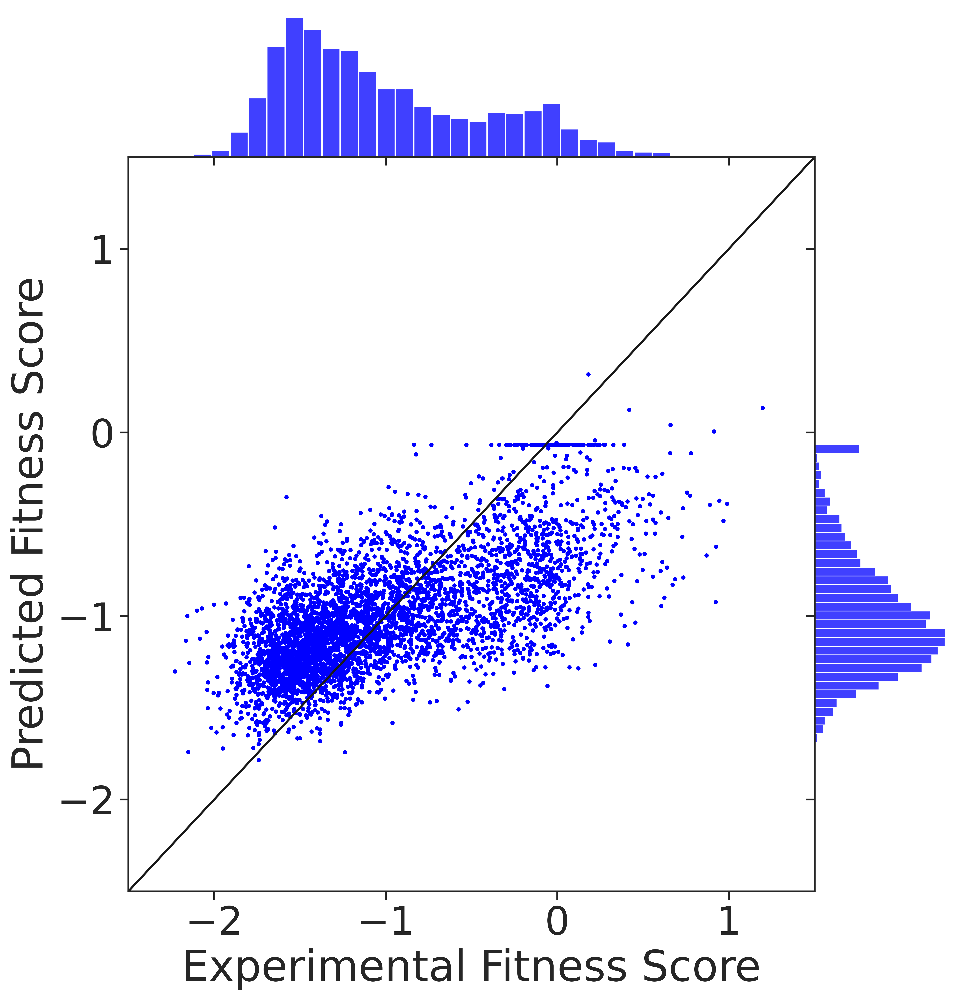

In [4]:
sns.set_theme(rc={'figure.dpi': 600},style='ticks',font_scale=2.5)

InModel=joblib.load('Models/AAV_RF_PLM_Model.pkl')
preds=InModel.predict(IX_test)


lims = [-2.5,1.5]
h=sns.jointplot(x=Iy_test.values, y=preds, xlim=lims, ylim=lims, color='blue',height=10,space=0,marker='.',linewidth=0)
h.ax_joint.plot(lims,lims, 'k-')
h.set_axis_labels("Experimental Fitness Score","Predicted Fitness Score")
plt.yticks([-2,-1,0,1])

Spearman=spearmanr(Iy_test.values, preds)
print(f'{Spearman}')
Pearson=pearsonr(Iy_test.values, preds)
print(f'Pearson Correlation and P-Score: {Pearson}')
RMSE=sqrt(mean_squared_error(Iy_test.values, preds))
print(f'RMSE: {RMSE}')
print('\n', '-' * 80, '\n')

In [5]:
X = np.loadtxt('Input/hvgVP1.txt')
df = pd.read_csv('Input/ogden_viral_selection_AAV2_sequences_VP1.csv')
y = df['selection_wt_norm_AVG']
y.pop(0)
print(X.shape, y.shape)

inds= np.digitize(y,[-2.0,-1.5,-1.0,-0.5,0,0.5])
frequency = collections.Counter(inds)
delete_index=[idx for idx, element in enumerate(inds) if element==2 or element==3]
remove_sequence_index=random.sample(delete_index,5095)

ydel=copy.deepcopy(list(y))
xdel=copy.deepcopy(X)
for index in sorted(remove_sequence_index, reverse=True):
    del ydel[index]

xdel=np.delete(xdel,remove_sequence_index,0)


train_size = 0.8
Xs_train, Xs_test, ys_train, ys_test = train_test_split(xdel, ydel, train_size=train_size, random_state=42)
a_list=df['AA_Sequences'].tolist()
a_list=[str(i) for i in a_list]
a_list.pop(0) #Make sure to account for this in applying selection_wt_norm_AVG. This was to remove the first empty entry 'nan'.
a_list=np.delete(a_list,remove_sequence_index,0)
onehot=seqs_to_onehot(a_list)
X_train, X_test, y_train, y_test = train_test_split(onehot, ydel, train_size=train_size, random_state=42)


(30844, 1900) (30844,)


SpearmanrResult(correlation=0.9346380473982755, pvalue=0.0)
Pearson Correlation and P-Score: (0.9341603033781538, 0.0)
RMSE: 0.2236714692659365

 -------------------------------------------------------------------------------- 



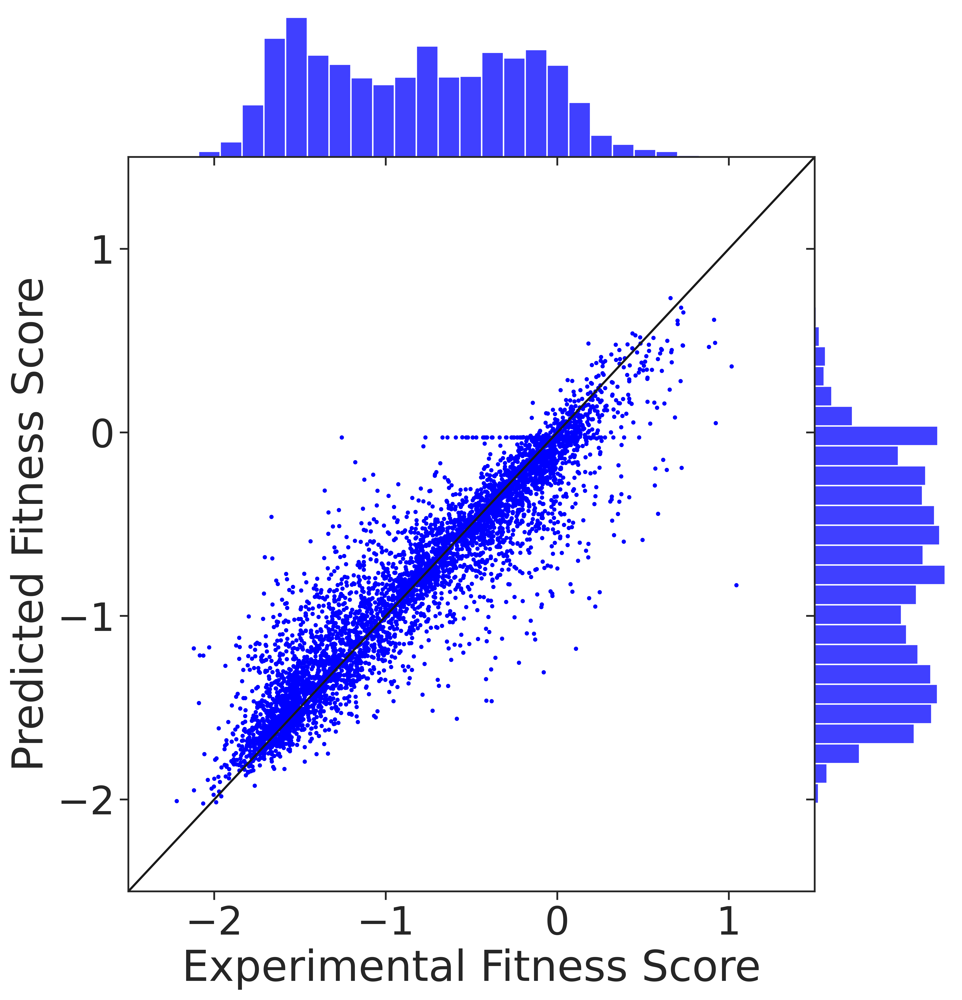

In [6]:
Model=joblib.load('Models/AAV_RF_PLM_Model_VP1_Weighted.pkl')
RidgeModel=joblib.load('Models/AAV_One_Hot_Model-755.pkl')
preds=Model.predict(Xs_test)
ridge_preds=RidgeModel.predict(X_test)
better_preds = np.add(ridge_preds,preds)
lims = [-2.5,1.5]
joint_kws=dict(cmap='seismic', mincnt=1, alpha=1)
h=sns.jointplot(x=ys_test, y=better_preds, xlim=lims, ylim=lims, color='blue',height=10,space=0,marker='.',linewidth=0)
h.ax_joint.plot(lims,lims, 'k-')
h.set_axis_labels("Experimental Fitness Score","Predicted Fitness Score")
plt.yticks([-2,-1,0,1])

Spearman=spearmanr(ys_test, better_preds)
print(f'{Spearman}')
Pearson=pearsonr(ys_test, better_preds)
print(f'Pearson Correlation and P-Score: {Pearson}')
RMSE=sqrt(mean_squared_error(ys_test, better_preds))
print(f'RMSE: {RMSE}')
print('\n', '-' * 80, '\n')

## Figure 2

### Wu et al. (2000) Predictions (Figure 2A)

In [ ]:
# Wu et al. (2000) has an error in one of the class 1 sequences. It should be KPAER, not KPKER. KPAER is used below
VP1='MAADGYLPDWLEDTLSEGIRQWWKLKPGPPPPKPAERHKDDSRGLVLPGYKYLGPFNGLDKGEPVNEADAAALEHDKAYDRQLDSGDNPYLKYNHADAEFQERLKEDTSFGGNLGRAVFQAKKRVLEPLGLVEEPVKTAPGKKRPVEHSPVEPDSSSGTGKAGQQPARKRLNFGQTGDADSVPDPQPLGQPPAAPSGLGTNTMATGSGAPMADNNEGADGVGNSSGNWHCDSTWMGDRVITTSTRTWALPTYNNHLYKQISSQSGASNDNHYFGYSTPWGYFDFNRFHCHFSPRDWQRLINNNWGFRPKRLNFKLFNIQVKEVTQNDGTTTIANNLTSTVQVFTDSEYQLPYVLGSAHQGCLPPFPADVFMVPQYGYLTLNNGSQAVGRSSFYCLEYFPSQMLRTGNNFTFSYTFEDVPFHSSYAHSQSLDRLMNPLIDQYLYYLSRTNTPSGTTTQSRLQFSQAGASDIRDQSRNWLPGPCYRQQRVSKTSADNNNSEYSWTGATKYHLNGRDSLVNPGPAMASHKDDEEKFFPQSGVLIFGKQGSEKTNVDIEKVMITDEEEIRTTNPVATEQYGSVSTNLQRGNRQAATADVNTQGVLPGMVWQDRDVYLQGPIWAKIPHTDGHFHPSPLMGGFGLKHPPPQILIKNTPVPANPSTTFSAAKFASFITQYSTGQVSVEIEWELQKENSKRWNPEIQYTSNYNKSVNVDFTVDTNGVYSEPRPIGTRYLTRNL'
Class_1_Mutants=[['DWLED','AWLAA'],['KLKPG','ALAPG'],['KPAER','APAAA'],['DSGDN','ASGAN'],['ERLKED','AALAAA'],['KKRPV','AAAPV'],
                ['EPDSS','APASS'],['GDADS','GAAAS'],['DSVPD','ASVPA'],['TTT','AAA'],['SEKTN','SAATN'],
                ['TDGHF','TAGAF'],['FGLKH','FGLAA']]
Class_1_Mutation_Count=[3,2,4,2,5,3,
                        2,2,2,3,2,
                        2,2]

Class_4b_Mutants=[['WHCDS','WACAS'],['MGDRV','MGAAV'],['NRFHC','NAFAC'],['FSPRD','FSPAA'],['RPKRL','APAAL'],['QDRDV','QAAAV'],
                 ['EIE','AAA'],['ENSKR','ASSAA']]
Class_4b_Mutation_Count=[2,2,2,2,3,3,
                        3,4]
Mutations=[]
Number_of_Mutations=[]
Mutant_Sequences=[]
Class=[]

for index, element in enumerate(Class_1_Mutants):
    Starting_Position=VP1.find(element[0])
    Mutant_Sequence=VP1[:Starting_Position]+element[1]+VP1[Starting_Position+len(element[0]):]
    Mutations.append(element)
    Number_of_Mutations.append(Class_1_Mutation_Count[index])
    Mutant_Sequences.append(Mutant_Sequence)
    Class.append(1)

for index, element in enumerate(Class_4b_Mutants):
    Starting_Position=VP1.find(element[0])
    Mutant_Sequence=VP1[:Starting_Position]+element[1]+VP1[Starting_Position+len(element[0]):]
    Mutations.append(element)
    Number_of_Mutations.append(Class_4b_Mutation_Count[index])
    Mutant_Sequences.append(Mutant_Sequence)
    Class.append(4)
    
Preds=scoring_func(Mutant_Sequences)
df=pd.DataFrame(data={'Class':Class,'Mutation':Mutations,'Number of Mutations':Number_of_Mutations,'Mutant Sequence':Mutant_Sequences,'Predicted Fitness':Preds})
df.to_csv('Predictions/Wu_Class_Predictions_WuMade2024.csv',index=False)
df

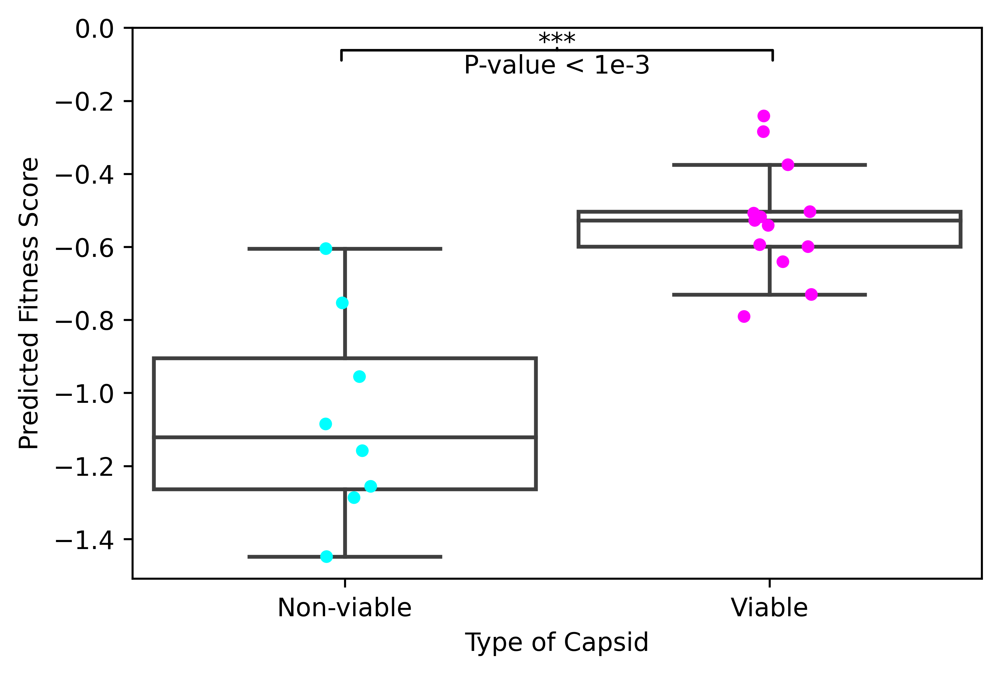

In [5]:
df=pd.read_csv('Predictions/Wu_Class_Predictions_WuMade2024.csv')
plt.rcParams.update({'font.size': 10})

data_1=df[df['Class']==4]['Predicted Fitness'].to_list()
data_2=df[df['Class']==1]['Predicted Fitness'].to_list()
data=[data_1,data_2]
fig = plt.subplots(figsize=(6,4),dpi=600)
Names=['Non-viable']*len(data_1)+['Viable']*len(data_2)
data_df=pd.DataFrame(data={'Type of Capsid':Names,'Predicted Fitness Score':data_1+data_2})

ax = sns.boxplot(x=data_df['Type of Capsid'],y=data_df['Predicted Fitness Score'],showfliers=False, hue=data_df['Type of Capsid'], boxprops={'facecolor':'none'}, dodge=False, saturation=0.3,width=0.9)
ax = sns.stripplot(x=data_df['Type of Capsid'],y=data_df['Predicted Fitness Score'], hue=data_df['Type of Capsid'], palette={'Non-viable':"cyan",'Viable':"magenta"}, size=5)

ax.set_ylabel('Predicted Fitness Score')
ax.set_ylim(top=0)
ax.annotate('***', xy=(0.5, 0.95), xytext=(0.5, 0.95), xycoords='axes fraction', 
            fontsize=10, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=8.5, lengthB=0.4', lw=1.0))
plt.text(0.5, 0.93, "P-value < 1e-3", horizontalalignment='center',
     verticalalignment='center',
     transform=ax.transAxes,fontsize=10)
plt.legend([],[], frameon=False)
plt.show()

In [3]:
stats,pvalue=scipy.stats.ks_2samp(data_1,data_2,alternative='greater')
print('Ks-test Between VP1 Classes')
print()
print(scipy.stats.ks_2samp(data_1,data_2,alternative='greater'))
if pvalue > 0.05:
    print('Non-viable has a greater or equal mean to Viable (fail to reject H0)')
else:
    print('Viable has a greater mean than Non-viable (reject H0)')
print('\n', '-' * 80, '\n')


Ks-test Between VP1 Classes

Ks_2sampResult(statistic=0.7980769230769231, pvalue=0.00065359477124183)
Viable has a greater mean than Non-viable (reject H0)

 -------------------------------------------------------------------------------- 



### Bryant et al. (2021) Predictions (Figure 2B)

In [ ]:
start=time.time()
Subsection_Size=1000
#Adapted from the Bryant et al. (2021) supplementary data.
new_df=pd.read_csv('Input/41587_2020_793_MOESM3_ESM.csv')
display(len(new_df))
full_sequences=new_df['sequence'].astype(str).values.tolist()
VP1_Beginning='MAADGYLPDWLEDTLSEGIRQWWKLKPGPPPPKPAERHKDDSRGLVLPGYKYLGPFNGLDKGEPVNEADAAALEHDKAYDRQLDSGDNPYLKYNHADAEFQERLKEDTSFGGNLGRAVFQAKKRVLEPLGLVEEPVKTAPGKKRPVEHSPVEPDSSSGTGKAGQQPARKRLNFGQTGDADSVPDPQPLGQPPAAPSGLGTNTMATGSGAPMADNNEGADGVGNSSGNWHCDSTWMGDRVITTSTRTWALPTYNNHLYKQISSQSGASNDNHYFGYSTPWGYFDFNRFHCHFSPRDWQRLINNNWGFRPKRLNFKLFNIQVKEVTQNDGTTTIANNLTSTVQVFTDSEYQLPYVLGSAHQGCLPPFPADVFMVPQYGYLTLNNGSQAVGRSSFYCLEYFPSQMLRTGNNFTFSYTFEDVPFHSSYAHSQSLDRLMNPLIDQYLYYLSRTNTPSGTTTQSRLQFSQAGASDIRDQSRNWLPGPCYRQQRVSKTSADNNNSEYSWTGATKYHLNGRDSLVNPGPAMASHKDDEEKFFPQSGVLIFGKQGSEKTNVDIEKVMIT'
VP1_End='QAATADVNTQGVLPGMVWQDRDVYLQGPIWAKIPHTDGHFHPSPLMGGFGLKHPPPQILIKNTPVPANPSTTFSAAKFASFITQYSTGQVSVEIEWELQKENSKRWNPEIQYTSNYNKSVNVDFTVDTNGVYSEPRPIGTRYLTRNL'
total_sequences=[]
for index, text in enumerate(full_sequences):
    if '*' in text:
        text=text.split('*',1)[0]
    total_sequences.append(VP1_Beginning+text.upper()+VP1_End)
new_df['AA Sequence']=total_sequences
Total_Preds=[]
for i in range(0,math.floor(len(total_sequences)/Subsection_Size)):
    subset_sequences=total_sequences[i*Subsection_Size:(i+1)*Subsection_Size]
    print(len(subset_sequences))
    preds=scoring_func(subset_sequences)
    Total_Preds.extend(preds)
preds=scoring_func(total_sequences[(i+1)*Subsection_Size:])
Total_Preds.extend(preds)
new_df['Predicted Fitness']=Total_Preds

new_df.to_csv('Predictions/All_Mutations_Bryant_Predictions.csv',index=False)
end=time.time()
print(f'This took {end-start} seconds to complete.')
new_df

In [ ]:
Full_df=pd.read_csv('Predictions/All_Mutations_Bryant_Predictions.csv')

Comparison_df=pd.DataFrame()
Pvals=[]
tstat=[]
Cohen_Effect=[]
Num_Mutations=[]

def cohend(d1, d2):
 # calculate the size of samples
 n1, n2 = len(d1), len(d2)
 # calculate the variance of the samples
 s1, s2 = var(d1, ddof=1), var(d2, ddof=1)
 # calculate the pooled standard deviation
 s = sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
 # calculate the means of the samples
 u1, u2 = mean(d1), mean(d2)
 # calculate the effect size
 return (u1 - u2) / s

for Name in range(2,40):
    
    df=Full_df[Full_df['num_mutations']==Name].copy()
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    if len(set(df['is_viable']))==2:
        Num_Mutations.append(Name)
        Viable=df[df['is_viable']==True]['Predicted Fitness'].values
        NonViable=df[df['is_viable']==False]['Predicted Fitness'].values
        stat,pvalue=scipy.stats.ks_2samp(Viable,NonViable,alternative='less')
        Pvals.append(pvalue)
        tstat.append(stat)
        Cohen_Effect.append(cohend(Viable,NonViable))

Comparison_df['Number of Mutations']=Num_Mutations
Comparison_df['KS-test statistic']=tstat
Comparison_df['Ks-test p-values']=Pvals
Comparison_df['Cohen Effect']=Cohen_Effect
fdr=fdrcorrection(Pvals, alpha=0.05, method='n')
Comparison_df['fdr corrected t-test significance against AAV2']=fdr[0]
Comparison_df.to_csv('Predictions/Bryant Group Comparison.csv',index=False)
Comparison_df

### Box Plots

In [7]:
fig = plt.subplots(figsize=(20, 10), dpi=600)
plt.rcParams.update({'font.size': 30})
Bryant_df=pd.read_csv('Predictions/All_Mutations_Bryant_Predictions.csv')
Bryant_df.rename(columns={'num_mutations':'Number of Mutations','Predicted Fitness':'Predicted Fitness Score','is_viable':'Category'},inplace=True)
Bryant_df=Bryant_df[Bryant_df['Number of Mutations'].isin(list(range(2,30)))]
Bryant_df['Category']=['Non-viable' if i==False else 'Viable' for i in Bryant_df['Category'].values]
ax = sns.boxplot(x=Bryant_df['Number of Mutations'],y=Bryant_df['Predicted Fitness Score'], hue=Bryant_df['Category'],palette={'Viable':"magenta",'Non-viable':"cyan"},
                 hue_order=['Non-viable','Viable'],showfliers=False)
sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False,
)
plt.show()

### Line Plots (Figure 2C)

In [9]:
plt.rcParams.update({'font.size': 30})

fig, ax = plt.subplots(figsize=(20, 10), dpi=600)
Comparison_df=pd.read_csv('Predictions/Bryant Group Comparison.csv')
ax.plot(Comparison_df['Number of Mutations'],Comparison_df['KS-test statistic'],color='black',linewidth=5)
ax.set_xlim([2,29])
ax.set_xticks(range(2,30))
ax.set_xlabel('Number of Mutations')
ax.set_ylabel('KS-test Statistic')

Text(0, 0.5, 'KS-test Statistic')

### Biological Validation (Figure 2D)

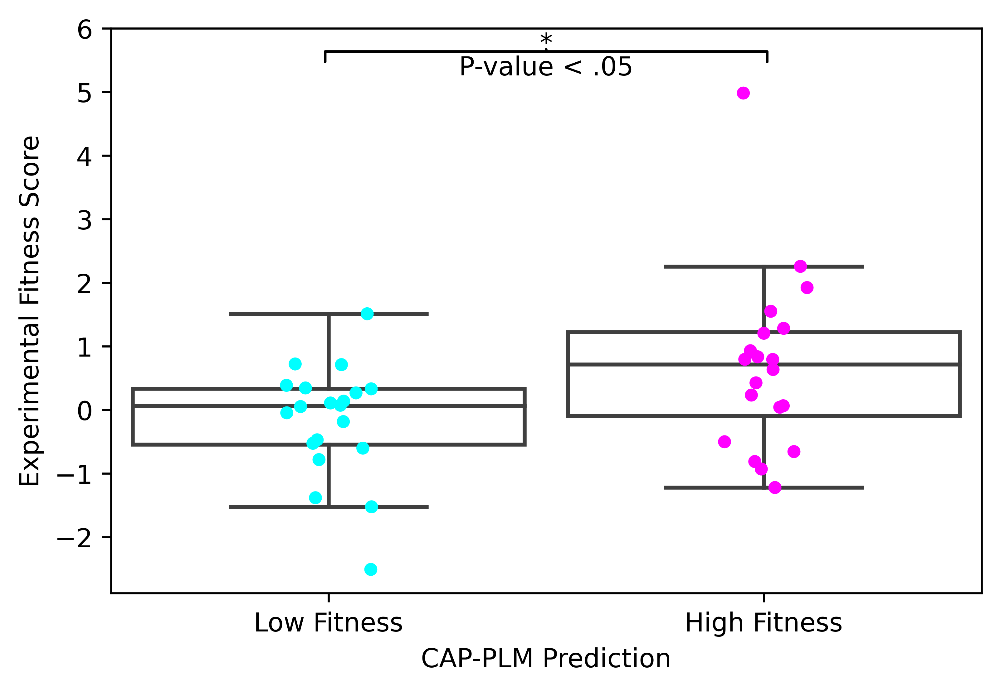

In [10]:
df=pd.read_csv('Predictions/Randomly_Generated_AAV2_Sequences.csv')
plt.rcParams.update({'font.size': 10})
fig = plt.subplots(figsize=(6,4),dpi=600)


ax = sns.boxplot(x=df['CAP-PLM Prediction'],y=df['Experimental Fitness Score'],showfliers=False, boxprops={'facecolor':'none'}, dodge=False, saturation=0.3,width=0.9)
ax = sns.stripplot(x=df['CAP-PLM Prediction'],y=df['Experimental Fitness Score'], palette={'Low Fitness':"cyan",'High Fitness':"magenta"}, size=5)
ax.set_ylim(top=6)
ax.set_ylabel('Experimental Fitness Score')
ax.annotate('*', xy=(0.5, 0.95), xytext=(0.5, 0.95), xycoords='axes fraction', 
            fontsize=10, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=8.5, lengthB=0.4', lw=1.0))
plt.text(0.5, 0.93, "P-value < .05", horizontalalignment='center',
     verticalalignment='center',
     transform=ax.transAxes,fontsize=10)
plt.legend([],[], frameon=False)
plt.show()

In [9]:
# The null hypothesis is that the Low Fitness sequences have a greater or equal experimental fitness to the High Fitness sequences
data_1=df[df['CAP-PLM Prediction']=='Low Fitness']['Experimental Fitness Score']
data_2=df[df['CAP-PLM Prediction']=='High Fitness']['Experimental Fitness Score']
stat,pvalue=scipy.stats.ks_2samp(data_1,data_2,alternative='greater')
print('Ks-test Between VP1 Classes')
print()
print(scipy.stats.ks_2samp(data_1,data_2,alternative='greater'))
if pvalue > 0.05:
    print('Low Fitness has a greater or equal mean to High Fitness (fail to reject H0)')
else:
    print('High Fitness has a greater mean than Low Fitness (reject H0)')
print('\n', '-' * 80, '\n')


Ks-test Between VP1 Classes

KstestResult(statistic=0.45, pvalue=0.016770835361540015)
High Fitness has a greater mean than Low Fitness (reject H0)

 -------------------------------------------------------------------------------- 



## Supplementary Figures

In [56]:
#Label line with line2D label data

plt.rcParams.update({'font.size': 20})
def labelLine(line,xvals,yvals,label=None,align=True,**kwargs):

    ax = line.axes
    xdata = line.get_xdata()
    ydata = line.get_ydata()

    #Find corresponding y co-ordinate and angle of the line
    for index, x in enumerate(xvals):
        ip = 1
        for i in range(len(xdata)):
            if x < xdata[i]:
                ip = i
                break
        y=yvals[index]


        if align:
            #Compute the slope
            dx = xdata[ip] - xdata[ip-1]
            dy = ydata[ip] - ydata[ip-1]
            ang = degrees(atan2(dy,dx))

            #Transform to screen co-ordinates
            pt = np.array([x,y]).reshape((1,2))
            trans_angle = ax.transData.transform_angles(np.array((ang,)),pt)[0]

        else:
            trans_angle = 0

        #Set a bunch of keyword arguments
        if 'color' not in kwargs:
            kwargs['color'] = line.get_color()

        if ('horizontalalignment' not in kwargs) and ('ha' not in kwargs):
            kwargs['ha'] = 'center'

        if ('verticalalignment' not in kwargs) and ('va' not in kwargs):
            kwargs['va'] = 'center'

        if 'backgroundcolor' not in kwargs:
            kwargs['backgroundcolor'] = ax.get_facecolor()

        if 'clip_on' not in kwargs:
            kwargs['clip_on'] = True

        if 'zorder' not in kwargs:
            kwargs['zorder'] = 2.5

        ax.text(x,y,label[index],rotation=0,**kwargs)
        ax.plot([x,x],[min(yvals)-.02,y-.001],color=line.get_color(),linestyle='dotted')
        ax.set_ylim([min(yvals)-.02,max(yvals)+.02])
def labelLines(lines,labels,xvals,yvals,align=True,**kwargs):
    
    ax = lines[0].axes
    labLines = []
    
    for line in lines:
        labelLine(line,xvals,yvals,labels,align,**kwargs)

### Hyperparameter Tuning Pearson Line Plot (Supplementary Figure 1)

In [57]:
fig = plt.figure(figsize=(20, 16), dpi=600)

X = list(np.linspace(0,1,8))
A = [.678,.662, .721, .701, .755, .719, .818,.805]

Label=['Original','Remove Stop Codon', 'VP1', 'mlstm 256', 'High Fitness','More Top Models','PLM+One-Hot','ESM2']

plt.plot(X,A,color='black')

labelLines(lines=plt.gca().get_lines(),labels=A,xvals=X,yvals=A,zorder=2)
plt.xticks(X, Label,fontsize=16)
plt.xlabel('Parameters')
plt.ylabel('Pearson Correlation')
plt.savefig('Figures/CAP-PLM Figures S1.png',dpi=600)
plt.show()

### Hyperparameter Tuning RMSE Line Plot (Supplementary Figure 2)

In [58]:
fig = plt.figure(figsize=(20, 16), dpi=600)

X = list(np.linspace(0,1,8))
A = [.446,.449,.403,.414,.411,.423,.362,.375]

Label=['Original','Remove Stop Codon', 'VP1', 'mlstm 256', 'High Fitness','More Top Models','PLM+One-Hot','ESM2']

plt.plot(X,A,color='black')

labelLines(lines=plt.gca().get_lines(),labels=A,xvals=X,yvals=A,zorder=2)
plt.xticks(X, Label,fontsize=16)
plt.xlabel('Parameters')
plt.ylabel('RMSE')
plt.savefig('Figures/CAP-PLM Figures S2.png',dpi=600)
plt.show()

### Regression Model Architecture Comparison (Supplementary Figure 3)

In [8]:
fig = plt.figure(figsize=(20, 16), dpi=600)

A = [.3994,.4691,.520,.5226,.6317,.719,.7549]
Label=['Ridge','Decision Tree','SVR','NuSVR','RNR','KNN','Random Forest']
plt.bar(Label,A,color='blue')

plt.xlabel('Top Models')
plt.ylabel('Pearson Correlation')
plt.savefig('Figures/CAP-PLM Figures S3.png',dpi=600)
plt.show()

### Comparisons Between Rebalancing Supplementary Figure 4

In [7]:
plt.rcParams.update({'font.size': 30})
df = pd.read_csv('Input/ogden_viral_selection_AAV2_sequences_VP1.csv')
y = df['selection_wt_norm_AVG']
y.pop(0)
inds= np.digitize(y,[-2.0,-1.5,-1.0,-0.5,0,0.5])
frequency = collections.Counter(inds)
delete_index=[idx for idx, element in enumerate(inds) if element==2 or element==3]
remove_sequence_index=random.sample(delete_index,5095)
ydel=copy.deepcopy(list(y))
for index in sorted(remove_sequence_index, reverse=True):
    del ydel[index]
    
fig = plt.figure(figsize=(20, 16), dpi=600)
sns.histplot(y,color='black',binwidth=.1,kde=True,element='poly')
sns.histplot(ydel,color='red',binwidth=.1,kde=True,element='poly')
plt.xlabel('Fitness Score')
plt.ylabel('Frequency')
plt.legend(['Before Rebalancing','After Rebalancing'])
plt.savefig('Figures/CAP-PLM Figures S4.png',dpi=600)
plt.show()